# Single-cell RNA-seq Analysis Pipeline

This notebook performs single-cell RNA-seq analysis using Scanpy, Decoupler, and other tools.  
The pipeline is organized into modular functions that cover:

- Data loading (10x matrices, manual annotations)
- Hashtag renaming and demultiplexing
- Filtering (doublets/empty droplets, manual annotation removal)
- Quality control and QC filtering
- Merging datasets and creating experimental subsets
- Normalization, log-transformation, and highly variable gene detection
- Cell cycle analysis and mitochondrial regression
- Dimensionality reduction (PCA, UMAP) and clustering (Leiden)
- Cell type assignment and visualization (UMAPs, density plots, bar charts)
- Differential expression analysis (Wilcoxon tests and volcano plots)
- Specific gene analysis (dual contrasts and violin plots)
- Pseudobulk analysis with Decoupler and DESeq2
- Comparison of Wilcoxon versus pseudobulk DEGs (Venn diagrams)
- Transcription factor inference using Decoupler
- Gene Ontology analysis using g:Profiler
- Saving a minimal AnnData object for publication

**Consistent Color Mapping:**  
To ensure that key metadata fields (genotype, treatment, apoe) use the same colors throughout,  
we define a helper function that maps each category to one of three colors (using the tab20 palette: orange, green, and skyblue).  
These palettes are then applied to all plots that display these categories.

Memory management is handled explicitly via garbage collection.  
Each section is encapsulated in functions for clarity and reproducibility.

In [1]:
# Import libraries and set up environment

import re
import os
import sys
import gc
import warnings
from math import ceil

import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from bbknn import bbknn
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import omnipath
import importlib

# Add the notebook directory to sys.path so custom modules can be imported
notebook_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
if notebook_dir not in sys.path:
    sys.path.append(notebook_dir)

import func_lib as f
importlib.reload(f)

# Suppress pandas performance warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

# Set global random seed for reproducibility
SEED = 2
np.random.seed(SEED)

## Global Variables and File Paths

Adjust these paths to match your system. The mapping dictionaries for genotype and treatment are defined here.

In [2]:
GENOTYPE_MAP = {
    "K191": "E3FAD", "K192": "E3FAD", "K190": "E3WT", "K193": "E3WT", 
    "G118": "E4FAD", "G119": "E4FAD", "G120": "E4FAD", "G122": "E4WT",
    "K231": "E3FAD", "K233": "E3FAD", "K234": "E3FAD", "K219": "E4FAD",
    "G143": "E4WT", "G146": "E4WT", "K232": "E3WT", "G180": "E4WT", 
    "G183": "E4WT", "G184": "E4WT", "G185": "E4WT", "G186": "E4FAD",
    "K248": "E3WT", "K249": "E3WT", "K250": "E3FAD", "K252": "E3FAD", 
    "G177": "E4FAD", "G178": "E4FAD", "G179": "E4FAD", "G145": "E4FAD",
    "K257": "E3WT", "K261": "E3WT", "K262": "E3WT", "K268": "E3FAD",
    "K283": "E3WT", "K284": "E3FAD"
}
TREATMENT_MAP = {
    "K191": "LPS", "K192": "LPS", "K190": "LPS", "K193": "LPS", 
    "G118": "VEHICLE", "G119": "VEHICLE", "G120": "VEHICLE", "G122": "VEHICLE",
    "K231": "VEHICLE", "K233": "VEHICLE", "K234": "VEHICLE", "K219": "LPS",
    "G143": "LPS", "G146": "LPS", "K232": "VEHICLE", "G180": "LPS", 
    "G183": "VEHICLE", "G184": "VEHICLE", "G185": "VEHICLE", "G186": "VEHICLE",
    "K248": "LPS", "K249": "LPS", "K250": "LPS", "K252": "LPS", 
    "G177": "LPS", "G178": "LPS", "G179": "LPS", "G145": "LPS",
    "K257": "VEHICLE", "K261": "VEHICLE", "K262": "VEHICLE", "K268": "VEHICLE",
    "K283": "LPS", "K284": "LPS"
}
DATA_PATHS = {
    "D1": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/collect_tube_1_batch_3_June_outs/filtered_feature_bc_matrix",
    "D2": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/collect_tube_2_batch_3_june_outs/filtered_feature_bc_matrix",
    "D3": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/Isol_Microglia_EFAD_TD_august_outs/filtered_feature_bc_matrix",
    "D4": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/MICROGLIA_E3E4FAD_TD_23_05_2023_outs/filtered_feature_bc_matrix",
    "D5": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/Tube_1_July_20_TD_YYRFC_outs/filtered_feature_bc_matrix",
    "D6": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/Tube2_July_20_TD_outs/filtered_feature_bc_matrix",
    "D7": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/Tube3_july_20_TD_outs/filtered_feature_bc_matrix",
    "D8": "/Users/loganlarlham/Documents/Summer_proj_2024/Results_HT/Isol_microglia_EFAD_Sept_outs/outs/filtered_feature_bc_matrix"
}
MANUAL_ANNOTATIONS_PATH = 'manual_annotation.csv'

## Helper Functions for Consistent Palettes

The functions below guarantee that whenever a plot is made for the categorical variables  
**genotype, treatment, and apoe**, a consistent palette is used.  
Here we choose a base palette of three colors (tab:orange, tab:green, tab:skyblue)  
and cycle through them for however many categories are present.

In [6]:
def get_palette(indices):
    """
    Given a list of indices, return a list of colors from the tab20 colormap.
    """
    return [plt.cm.tab20(i) for i in indices]

def set_consistent_palettes(adata):
    """
    For each of 'genotype', 'treatment', and 'apoe', set a categorical ordering  
    and store the corresponding palette in adata.uns using specific tab20 indices.
    """
    # Define which tab20 indices to use for each variable
    palette_indices = {
        'genotype': [2, 3],
        'treatment': [4, 5],
        'apoe': [18, 19]
    }
    
    for var in ['genotype', 'treatment', 'apoe']:
        # Get sorted unique categories
        cats = sorted(adata.obs[var].dropna().unique())
        # Set categorical ordering
        adata.obs[var] = pd.Categorical(adata.obs[var], categories=cats, ordered=True)
        
        # Retrieve the indices for this variable; you might want to check that len(cats)
        # matches the length of palette_indices[var] if needed.
        indices = palette_indices.get(var, [])
        adata.uns[f'{var}_palette'] = get_palette(indices)

## Pipeline Functions

The following cells define functions for each major step of the pipeline.  
(For brevity, comments within functions explain the process.  
You can further customize each function as needed.)

In [4]:
def load_data(data_paths):
    """
    Load 10x Genomics data into a dictionary of AnnData objects.
    """
    adatas = {}
    for key, path in data_paths.items():
        adatas[key] = sc.read_10x_mtx(
            path,
            var_names="gene_symbols",
            cache=False,
            make_unique=True,
            gex_only=False
        )
    return adatas

def load_manual_annotations(path):
    """
    Load manual annotation CSV file.
    """
    return pd.read_csv(path, index_col=0)

def print_hashtag_info(adata):
    """
    For dataset D8, print hashtag info including gene_ids, index, and counts.
    """
    hashtag_mask = adata.var['feature_types'] == 'Antibody Capture'
    print(f"Number of hashtags in D8: {adata.var[hashtag_mask].shape[0]}")
    for idx, row in adata.var.iterrows():
        if row["feature_types"] == "Antibody Capture":
            print(f"gene_ids: {row['gene_ids']}")
            print(f"index: {idx}")
            col_index = adata.var_names.get_loc(idx)
            count = adata.X[:, col_index].sum()
            print(f"Number of {idx} in D8: {count}\n")

def rename_hashtags_d8(adata):
    """
    Rename hashtag features for dataset D8 and remove unwanted ones.
    """
    print(f"Number of vars in D8 before: {adata.var.shape[0]}")
    var_df = adata.var.copy()
    variables_to_remove = []
    rename_dict = {}
    for index, row in var_df.iterrows():
        if row["feature_types"] == "Antibody Capture":
            if row['gene_ids'] == "Hashtag_1":
                rename_dict[index] = 'K283'
            elif row['gene_ids'] == "Hashtag_2":
                rename_dict[index] = 'K284'
            elif row['gene_ids'] in ["Hashtag_3", "Hashtag_4"]:
                variables_to_remove.append(index)
    var_df.rename(index=rename_dict, inplace=True)
    adata.var = var_df
    adata.var_names = var_df.index
    adata = adata[:, ~adata.var.index.isin(variables_to_remove)]
    print(f"Number of vars in D8 after removal: {adata.var.shape[0]}")
    for index, row in adata.var.iterrows():
        if row["feature_types"] == "Antibody Capture":
            print(f"gene_ids: {row['gene_ids']}  index: {index}\n")
    return adata

def demultiplex_hashtags(adatas):
    """
    Demultiplex hashtag counts from each dataset.
    """
    for key, adata in adatas.items():
        hashtag_mask = adata.var['feature_types'] == 'Antibody Capture'
        hashtag_vars = adata.var_names[hashtag_mask]
        for ht in hashtag_vars:
            adata.obs[ht] = adata[:, ht].X.toarray().ravel()
        if key == "D8":
            f.hash_demulitplex(adata, hashtag_vars, number_of_noise_barcodes=1)
        else:
            f.hash_demulitplex(adata, adata.obs.columns)
    return adatas

def filter_cells_and_annotate(adatas):
    """
    Remove doublets and empty droplets, then add metadata using mapping dictionaries.
    """
    for key, adata in adatas.items():
        print(f"Processing {key}:")
        print(f"Cells before filtering: {adata.obs.shape[0]}")
        mask = ~adata.obs['most_likely_hypothesis'].isin([0, 2])
        adata = adata[mask].copy()
        adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: GENOTYPE_MAP.get(x, None))
        adata.obs["apoe"] = adata.obs["Classification"].map(lambda x: GENOTYPE_MAP.get(x, None)[:2] if GENOTYPE_MAP.get(x, None) else None)
        adata.obs["disease"] = adata.obs["Classification"].map(lambda x: GENOTYPE_MAP.get(x, None)[2:] if GENOTYPE_MAP.get(x, None) else None)
        adata.obs["treatment"] = adata.obs["Classification"].map(lambda x: TREATMENT_MAP.get(x, None))
        adata.obs['genotype_treatment'] = adata.obs['genotype'] + '_' + adata.obs['treatment']
        print(f"Cells after filtering: {adata.obs.shape[0]}\n")
        adatas[key] = adata
    return adatas

def group_and_print_sizes(adatas):
    """
    For each dataset, print group sizes by Classification and disease and compute mean sizes.
    """
    for key, adata in adatas.items():
        print(f"Processing group sizes for {key}:")
        group_sizes = adata.obs.groupby(["Classification", "disease"]).size().reset_index(name='size')
        mean_sizes = group_sizes.groupby("disease")["size"].mean().reset_index()
        print(f"Mean sizes for {key}:")
        print(mean_sizes, "\n")
        print("Group counts by Classification and genotype:")
        print(adata.obs.groupby(["Classification", "genotype"]).size().sort_values(ascending=False), "\n")

def remove_hashtag_genes(adatas):
    """
    Remove hashtag genes (based on keys in GENOTYPE_MAP) from each dataset.
    """
    for key, adata in adatas.items():
        print(f"Removing hashtag genes from {key}:")
        hashtag_genes = [gene for gene in adata.var_names if any(ht in gene for ht in GENOTYPE_MAP.keys())]
        adata = adata[:, ~adata.var_names.isin(hashtag_genes)]
        adatas[key] = adata
        for hashtag in GENOTYPE_MAP.keys():
            if hashtag in adata.var_names:
                print(f"{hashtag} is present in .var")
            else:
                print(f"{hashtag} is not present in .var")
        print()
    return adatas

def quality_control(adatas):
    """
    Print QC metrics and filter based on QC thresholds.
    """
    for key, adata in adatas.items():
        print(f"Quality metrics for {key}:")
        f.summarize_adata(adata, mt_gene_prefix="mt-", ribo_gene_prefixes=("Rps", "Rpl"), 
                          min_counts=2000, min_genes=300, min_cells=3)
        print()
    f.visualize_QC_measures(adatas)
    QC_filtered = {}
    for key, adata in adatas.items():
        print(f"Applying QC filter for {key}:")
        QC_filtered[key] = f.QC_filter_adata(adata, mt_threshold=5, ribo_threshold=5, 
                                             min_counts=2000, min_genes=300, min_cells=3)
        print()
    f.visualize_QC_measures(QC_filtered)
    return QC_filtered

def remove_non_microglia(QC_filtered, manual_annotations):
    """
    Remove cells annotated as 'Other' (non-microglia) based on manual annotations.
    """
    total_before, total_after = 0, 0
    for i, (key, adata) in enumerate(QC_filtered.items()):
        print(f"Processing non-microglia removal for {key}:")
        cell_ids = adata.obs.index
        total_before += len(cell_ids)
        expected_suffix = f'_{i}'
        manual_cells_with_suffix = manual_annotations[manual_annotations.index.str.endswith(expected_suffix)]
        manual_cells = manual_cells_with_suffix.index.str.replace(expected_suffix, '')
        other_cells = manual_cells_with_suffix[manual_cells_with_suffix['manual_annotation'] == 'Other'].index
        other_cells_no_suffix = other_cells.str.replace(expected_suffix, '')
        print(f"Removing {len(other_cells)} cells annotated as 'Other' from {key}")
        adata = adata[~adata.obs.index.isin(other_cells_no_suffix)].copy()
        total_after += adata.obs.shape[0]
        QC_filtered[key] = adata
        print(f"Cells after removal for {key}: {adata.obs.shape[0]}\n")
    print(f"Total cells before removal: {total_before}")
    print(f"Total cells after removal: {total_after}\n")
    return QC_filtered

def merge_datasets(adatas):
    """
    Merge all filtered AnnData objects into a single AnnData object.
    """
    merged = ad.concat(list(adatas.values()), axis=0, label="sample", join="outer", merge="unique")
    merged.obs_names_make_unique()
    del adatas
    gc.collect()
    print("Datasets merged:")
    print(merged)
    return merged

def create_subsets(adata):
    """
    Create subsets based on genotype, treatment, and apoe groups.
    """
    subsets = {}
    for genotype in ['E3FAD', 'E4FAD', 'E3WT', 'E4WT']:
        sub = adata[adata.obs['genotype'] == genotype].copy()
        sub.uns['name'] = genotype
        subsets[genotype] = sub
    for genotype in ['E3FAD', 'E4FAD', 'E3WT', 'E4WT']:
        for treatment in ['LPS', 'VEHICLE']:
            key = f"{genotype}_{treatment}"
            sub = adata[(adata.obs['genotype'] == genotype) & (adata.obs['treatment'] == treatment)].copy()
            sub.uns['name'] = key
            subsets[key] = sub
    for apoe in ['E3', 'E4']:
        sub = adata[adata.obs['apoe'] == apoe].copy()
        sub.uns['name'] = apoe
        subsets[apoe] = sub
        for treatment in ['LPS', 'VEHICLE']:
            key = f"{apoe}_{treatment}"
            sub2 = sub[sub.obs['treatment'] == treatment].copy()
            sub2.uns['name'] = key
            subsets[key] = sub2
    print("Created subsets:")
    for key in subsets.keys():
        print(key, end='  ')
    print("\n")
    return list(subsets.values())

def normalize_and_hvg(adata, subsets):
    """
    Save raw counts, normalize, log-transform, and compute highly variable genes.
    """
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    adata.layers['log_norm'] = adata.X.copy()
    adata.obs["norm_total_counts"] = adata.X.sum(axis=1)
    f.plot_total_counts_vs_cells(adata, bins=250, zoom_x_range=(0, 5000), zoom_y_range=(0, 1000))
    sc.pp.highly_variable_genes(adata, batch_key="sample")
    num_hvg = adata.var['highly_variable'].sum()
    total_genes = adata.var.shape[0]
    print(f"{num_hvg} out of {total_genes} genes are highly variable.")
    for sub in subsets:
        sub.layers["counts"] = sub.X.copy()
        sc.pp.normalize_total(sub)
        sc.pp.log1p(sub)
        sub.layers['log_norm'] = sub.X.copy()
        sc.pp.highly_variable_genes(sub, batch_key="sample")
        num_hvg_sub = sub.var['highly_variable'].sum()
        tot_genes_sub = sub.var.shape[0]
        print(f"In {sub.uns.get('name', 'subset')}: {num_hvg_sub} out of {tot_genes_sub} genes are highly variable.")
    return adata

def cell_cycle_analysis(adata):
    """
    Annotate cell cycle, compute phase percentages overall and per sample/genotype.
    """
    adata.X = adata.layers["counts"].copy()
    adata = f.annotate_cellcycle_mouse(adata)
    df = adata.obs[['phase', 'genotype', 'apoe', 'treatment', 'disease']]
    total_phase_percentages = {}
    total_count = adata.obs.shape[0]
    for p in adata.obs['phase'].unique():
        count = (adata.obs['phase'] == p).sum()
        pct = round(count / total_count * 100, 2)
        total_phase_percentages[p] = pct
        print(f"Total percent of {p} phase: {pct}%")
    print()
    for s in adata.obs['sample'].unique():
        for p in adata.obs['phase'].unique():
            sample_count = adata[(adata.obs['phase'] == p) & (adata.obs['sample'] == s)].shape[0]
            total_sample = adata[adata.obs['sample'] == s].shape[0]
            sample_pct = round(sample_count / total_sample * 100, 2)
            diff = sample_pct - total_phase_percentages[p]
            diff_str = f"{diff:.2f}% higher" if diff > 0 else f"{-diff:.2f}% lower"
            print(f"{s}: {p} phase = {sample_pct}% ({diff_str} than overall)")
        print()
    for g in adata.obs['genotype'].dropna().unique():
        for p in adata.obs['phase'].unique():
            g_count = adata[(adata.obs['phase'] == p) & (adata.obs['genotype'] == g)].shape[0]
            total_g = adata[adata.obs['genotype'] == g].shape[0]
            g_pct = round(g_count / total_g * 100, 2)
            diff = g_pct - total_phase_percentages[p]
            diff_str = f"{diff:.2f}% higher" if diff > 0 else f"{-diff:.2f}% lower"
            print(f"{g}: {p} phase = {g_pct}% ({diff_str} than overall)")
        print()
    return adata

def regress_mitochondrial(adata, subsets):
    """
    Regress out mitochondrial gene effects.
    """
    adata.X = adata.layers['log_norm'].copy()
    adata = sc.pp.regress_out(adata, 'pct_counts_mt', copy=True)
    for sub in subsets:
        sub.X = sub.layers['log_norm'].copy()
        sub = sc.pp.regress_out(sub, 'pct_counts_mt', copy=True)
    return adata, subsets

def dimensionality_reduction(adata, subsets):
    """
    Run PCA, compute neighbors, run UMAP and plot results.
    """
    # Plot PCA for key variables using the consistent palettes if available.
    sc.tl.pca(adata)
    sc.pl.pca_variance_ratio(adata, n_pcs=50)
    # Plot individual PCA plots for genotype, treatment, and apoe
    if 'genotype_palette' in adata.uns:
        sc.pl.pca(adata, color="genotype", palette=adata.uns['genotype_palette'])
    if 'treatment_palette' in adata.uns:
        sc.pl.pca(adata, color="treatment", palette=adata.uns['treatment_palette'])
    if 'apoe_palette' in adata.uns:
        sc.pl.pca(adata, color="apoe", palette=adata.uns['apoe_palette'])
    sc.pp.neighbors(adata, n_pcs=25)
    sc.tl.umap(adata, min_dist=0.5)
    # When plotting UMAP for these variables, pass the palette if available.
    if 'genotype_palette' in adata.uns:
        sc.pl.umap(adata, color="genotype", palette=adata.uns['genotype_palette'])
    if 'treatment_palette' in adata.uns:
        sc.pl.umap(adata, color="treatment", palette=adata.uns['treatment_palette'])
    if 'apoe_palette' in adata.uns:
        sc.pl.umap(adata, color="apoe", palette=adata.uns['apoe_palette'])
    # Plot additional UMAPs without overriding palette
    sc.pl.umap(adata, color=['sample','pct_counts_mt', 'disease'], ncols=2)
    for sub in subsets:
        sc.tl.pca(sub)
        sc.pp.neighbors(sub, n_pcs=25)
        sc.tl.umap(sub)
    return adata, subsets

def clustering(adata, subsets):
    """
    Run Leiden clustering on the main dataset and on each subset.
    """
    res_range = np.arange(0.1, 2.0, 0.2)
    for i in res_range:
        key = f"leiden_{round(i,2)}"
        if key not in adata.obs:
            sc.tl.leiden(adata, resolution=round(i,2), random_state=0, n_iterations=2,
                         directed=False, key_added=key, flavor="igraph")
    leiden_keys = [f"leiden_{round(i,2)}" for i in res_range]
    sc.pl.umap(adata, color=leiden_keys, legend_loc="on data", ncols=2)
    for sub in subsets:
        r = np.arange(0.1, 1.4, 0.2)
        for i in r:
            key = f"leiden_{round(i,2)}"
            if key not in sub.obs:
                sc.tl.leiden(sub, resolution=round(i,2), random_state=0, n_iterations=2,
                             directed=False, key_added=key, flavor="igraph")
        keys = [f"leiden_{round(i,2)}" for i in r]
        sc.pl.umap(sub, color=keys, legend_loc="on data", ncols=3)
    return adata, subsets

def plot_degs_by_cluster(adata):
    """
    Plot UMAP with DEGs by cluster using a custom function.
    """
    f.plot_umap_with_gene_list(adata, 'leiden_1.9', n_top_genes=20)

def assign_cell_types(adata):
    """
    Assign cell type labels based on cluster (leiden_1.9) and update adata.obs['anno2'].
    """
    def assign_cell_types2(adata):
        adata.obs['anno2'] = ''
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['0','4']), 'anno2'] = 'Ribosomal with DAM markers'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['1','6','7']), 'anno2'] = 'DAM'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['2','3']), 'anno2'] = 'Interferon Response'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['5']), 'anno2'] = 'Cycling (G2M/Cdk1+)'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['8', '10', '18']), 'anno2'] = 'TIM/tCRM/ (Fos/Jun)'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['9','16','17','22','23']), 'anno2'] = 'Homeostatic'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['11']), 'anno2'] = 'Cytokine Response'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['12']), 'anno2'] = 'MHC-II/Antigen Presentation DAM'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['14', '19']), 'anno2'] = 'BAM-like'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['15']), 'anno2'] = 'MHC-II/Antigen Presentation Homeostatic'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['13', '20']), 'anno2'] = 'Neuronal Surveillance/Ribosomal biogenesis'
        adata.obs.loc[adata.obs['leiden_1.9'].isin(['21']), 'anno2'] = 'BAM-like'
        adata.obs.loc[adata.obs['anno2'] == '', 'anno2'] = 'Unknown'
    assign_cell_types2(adata)
    sc.tl.rank_genes_groups(adata, groupby='anno2', method='wilcoxon', use_raw=False)
    sc.pl.rank_genes_groups(adata, groupby='anno2', key='rank_genes_groups', n_genes=30)
    sc.pl.umap(adata, color=['Pde10a', 'Mrc1', 'Cd14', 'Neat1', 'Mafb', 'Pf4', 'Cd74', 'Itgb5', 'Serpine1'],
               size=100, ncols=2)
    print("Cell type counts:")
    print(adata.obs['anno2'].value_counts())
    return adata

def plot_cell_type_visualizations(adata):
    """
    Create UMAPs, density plots, and stacked bar charts for cell type visualization.
    """
    # Use the consistent palettes if available:
    if 'genotype_palette' in adata.uns:
        sc.pl.umap(adata, color='genotype', palette=adata.uns['genotype_palette'])
    if 'treatment_palette' in adata.uns:
        sc.pl.umap(adata, color='treatment', palette=adata.uns['treatment_palette'])
    if 'apoe_palette' in adata.uns:
        sc.pl.umap(adata, color='apoe', palette=adata.uns['apoe_palette'])
    
    # UMAP by cell type (anno2)
    sc.pl.umap(adata, color='anno2')
    
    # Category-specific UMAPs for genotype_treatment:
    desired_order = ['E3WT_VEHICLE', 'E4WT_VEHICLE', 'E3WT_LPS', 'E4WT_LPS', 
                     'E3FAD_VEHICLE', 'E4FAD_VEHICLE', 'E3FAD_LPS', 'E4FAD_LPS']
    adata.obs['genotype_treatment'] = pd.Categorical(adata.obs['genotype_treatment'],
                                                     categories=desired_order, ordered=True)
    categories = adata.obs['genotype_treatment'].cat.categories.tolist()
    n_category_cols = ceil(len(categories) / 2)
    fig = plt.figure(figsize=(15, 10))
    width_ratios = [1]*n_category_cols + [2]
    gs = fig.add_gridspec(nrows=2, ncols=n_category_cols + 1, width_ratios=width_ratios)
    fig.subplots_adjust(hspace=0.01, wspace=0.3)
    ax_general = fig.add_subplot(gs[:, -1])
    assign_cell_types(adata)
    sc.pl.umap(adata, color='anno2', size=10, title='Clustered UMAP of\nMicroglia',
               ax=ax_general, show=False)
    ax_general.set_aspect('equal')
    xlim, ylim = ax_general.get_xlim(), ax_general.get_ylim()
    min_limit, max_limit = min(xlim[0], ylim[0]), max(xlim[1], ylim[1])
    ax_general.set_xlim(min_limit, max_limit)
    ax_general.set_ylim(min_limit, max_limit)
    ax_general.set_title(ax_general.get_title(), fontsize=14)
    for idx, cat in enumerate(categories):
        row = idx % 2
        col = idx // 2
        ax = fig.add_subplot(gs[row, col])
        assign_cell_types(adata)
        sc.pl.umap(adata, color='anno2', groups=None, mask_obs=(adata.obs['genotype_treatment'] == cat),
                   size=15, title=f'Clustered UMAP of\n{cat} Microglia', ax=ax, show=False, legend_loc='none')
        ax.set_aspect('equal')
        xlim, ylim = ax.get_xlim(), ax.get_ylim()
        min_limit, max_limit = min(xlim[0], ylim[0]), max(xlim[1], ylim[1])
        ax.set_xlim(min_limit, max_limit)
        ax.set_ylim(min_limit, max_limit)
        ax.set_title(ax.get_title(), fontsize=12)
    plt.show()
    plt.close()
    sc.tl.embedding_density(adata, basis='umap', groupby='genotype_treatment',
                            key_added='umap_density_genotype_treatment')
    sc.pl.embedding_density(adata, basis='umap', key='umap_density_genotype_treatment',
                            ncols=4, show=True)
    counts = pd.crosstab(adata.obs['genotype_treatment'], adata.obs['anno2'])
    ax = counts.plot(kind='bar', stacked=True, figsize=(12, 8))
    plt.xlabel('Genotype Treatment')
    plt.ylabel('Number of Cells')
    plt.title('Cell Counts per Genotype Treatment and Cell Type')
    plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    plt.close()
    proportions = counts.div(counts.sum(axis=1), axis=0)
    ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 8))
    plt.xlabel('Genotype Treatment')
    plt.ylabel('Proportion of Cells')
    plt.title('Cell Type Proportions per Genotype Treatment')
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig("figures/stacked_bar_chart_proportions.png")
    plt.show()

def run_wilcoxon_degs(adata_subs):
    """
    Run Wilcoxon differential expression for each subset.
    """
    for sub in adata_subs:
        sub.X = sub.layers['log_norm'].copy()
        sc.tl.rank_genes_groups(sub, groupby='treatment', method='wilcoxon')
    e3fad = [s for s in adata_subs if s.uns['name'] == 'E3FAD'][0]
    e3fad_sig = f.plot_volcano(e3fad, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=200)
    print(f"Up-Regulated ({len(e3fad_sig['Up-regulated'])}): {e3fad_sig['Up-regulated']}")
    print(f"Down-Regulated ({len(e3fad_sig['Down-regulated'])}): {e3fad_sig['Down-regulated']}")
    e4fad = [s for s in adata_subs if s.uns['name'] == 'E4FAD'][0]
    e4fad_sig = f.plot_volcano(e4fad, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=15)
    print(f"Up-Regulated ({len(e4fad_sig['Up-regulated'])}): {e4fad_sig['Up-regulated']}")
    print(f"Down-Regulated ({len(e4fad_sig['Down-regulated'])}): {e4fad_sig['Down-regulated']}")

def specific_gene_analysis(adata):
    """
    For genes of interest, plot dual contrast and violin plots.
    """
    constant_contrast = {'apoe': 'E4', 'disease': 'FAD'}
    genes_of_interest = ['Itgb5', 'Atf3', 'Ccl4', 'Ccl3', 'Ccl2', 'Cd74', 
                         'H2-Ab1', 'H2-Eb1', 'H2-Aa', 'Cst7', 'Serinc3', 'Cx3cr1', 
                         'Lpl', 'Tmem163', 'Tmem178', 'Pianp', 'Rab7b', 'Lilrb4a', 'Minar1']
    for gene in genes_of_interest:
        f.plot_dual_contrast(adata, gene=gene, constant_contrast=constant_contrast,
                             contrast_variable='treatment', level1='VEHICLE', level2='LPS')
        sc.pl.violin(adata, keys=gene, groupby='genotype_treatment', use_raw=False,
                     stripplot=False, jitter=0.4, multi_panel=True, rotation=4, inner='box')
        sc.pl.violin(adata, keys=gene, groupby='anno2', use_raw=False,
                     stripplot=False, jitter=0.4, multi_panel=True, rotation=45, inner='box')

def pseudobulk_decoupler_analysis(adata_subs):
    """
    Perform pseudobulk analysis using Decoupler and DESeq2 on selected subsets.
    """
    selected_keys = ['E3WT', 'E4WT', 'E3FAD', 'E4FAD']
    selected = [s for s in adata_subs if s.uns['name'] in selected_keys]
    vehlps_stats = {}
    dc_vehlps_results = {}
    dc_vehlps_results_sig = {}
    dc_vehlps_upreg = {}
    dc_vehlps_downreg = {}
    for sadata in selected:
        a_name = sadata.uns['name']
        apoe = a_name[:2]
        disease = a_name[2:]
        sadata.X = sadata.layers['counts'].toarray()
        print(f"Processing pseudobulk for {a_name}...")
        print(f"Apoe: {apoe}, Disease: {disease}")
        dc_adata = dc.get_pseudobulk(sadata, sample_col='Classification', groups_col='genotype',
                                     mode='sum', min_cells=0, min_counts=0)
        dc.plot_psbulk_samples(dc_adata, groupby=['Classification', 'genotype', 'sample'],
                               figsize=(12, 4))
        dc_adata.layers['counts'] = dc_adata.X.copy()
        sc.pp.normalize_total(dc_adata, target_sum=1e4)
        sc.pp.log1p(dc_adata)
        sc.pp.scale(dc_adata, max_value=10)
        sc.tl.pca(dc_adata)
        dc.swap_layer(dc_adata, 'counts', inplace=True)
        sc.pl.pca(dc_adata, color=['disease', 'genotype', 'apoe', 'treatment', 'genotype_treatment', 'sample'],
                  ncols=3, size=300)
        sc.pl.pca(dc_adata, color=['disease', 'genotype', 'apoe', 'treatment'],
                  dimensions=(2,3), annotate_var_explained=True, ncols=2, size=300)
        sc.pl.pca_variance_ratio(dc_adata)
        dc.get_metadata_associations(dc_adata,
                                     obs_keys=['treatment', 'psbulk_n_cells', 'psbulk_counts'],
                                     obsm_key='X_pca',
                                     uns_key='pca_anova',
                                     inplace=True)
        pca_scores = dc_adata.obsm['X_pca']
        print("Any NaN in PCA scores:", np.isnan(pca_scores).any())
        print("Any Inf in PCA scores:", np.isinf(pca_scores).any())
        anova_results = dc_adata.uns['pca_anova']
        print("Any NaN in p-values:", anova_results['p_adj'].isna().any())
        print("Any Inf in p-values:", np.isinf(anova_results['p_adj']).any())
        n_components = dc_adata.obsm['X_pca'].shape[1]
        print("Number of PCs available:", n_components)
        print("PCA Component Variances:")
        print(dc_adata.obsm['X_pca'].var(axis=0))
        sc.pl.pca(dc_adata, color='treatment', size=300)
        inference = DefaultInference(n_cpus=8)
        dds = DeseqDataSet(adata=dc_adata, design_factors=['treatment'], refit_cooks=True,
                           inference=inference)
        dds.deseq2()
        key = f"{apoe}{disease}_vehlps"
        dds = DeseqStats(dds, contrast=['treatment', 'LPS', 'VEHICLE'])
        dds.summary()
        vehlps_stats[key] = dds
        dc_vehlps_results[key] = dds.results_df
        sig_results = dc_vehlps_results[key][dc_vehlps_results[key]['log2FoldChange'].abs() > 0.25]
        sig_results = sig_results[sig_results['padj'] < 0.05]
        sig_results = sig_results.sort_values(by='log2FoldChange', key=abs, ascending=False)
        dc_vehlps_results_sig[key] = sig_results
        dc_vehlps_upreg[key] = sig_results[sig_results['log2FoldChange'] > 0]
        dc_vehlps_downreg[key] = sig_results[sig_results['log2FoldChange'] < 0]
        print(f"Upregulated genes({len(dc_vehlps_upreg[key])}) for {key}:")
        print(dc_vehlps_upreg[key].index.to_list())
        print(f"Downregulated genes({len(dc_vehlps_downreg[key])}) for {key}:")
        print(dc_vehlps_downreg[key].index.to_list())
        fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
        dc.plot_volcano_df(data=dc_vehlps_results[key], x='log2FoldChange', y='padj',
                           top=50, sign_thr=0.05, lFCs_thr=0.25, ax=ax)
        ax.set_title(f"Veh vs LPS in {a_name}")
        plt.show()
        plt.close(fig)
        del dc_adata, dds
        gc.collect()
        print(f"Finished pseudobulk processing for {a_name}.\n")
    for key in dc_vehlps_upreg:
        dc_vehlps_upreg[key] = dc_vehlps_upreg[key].sort_values(by='padj')
        dc_vehlps_downreg[key] = dc_vehlps_downreg[key].sort_values(by='padj')
    from venn import venn
    dc_upregulated_sets = {
        "E3WT": set(dc_vehlps_upreg["E3WT_vehlps"].index),
        "E4WT": set(dc_vehlps_upreg["E4WT_vehlps"].index),
        "E3FAD": set(dc_vehlps_upreg["E3FAD_vehlps"].index),
        "E4FAD": set(dc_vehlps_upreg["E4FAD_vehlps"].index),
    }
    labels = venn.get_labels(list(dc_upregulated_sets.values()), fill=['number'])
    fig, ax = venn.venn4(labels, names=list(dc_upregulated_sets.keys()))
    plt.title("Upregulated Genes Venn Diagram")
    plt.show()
    dc_downregulated_sets = {
        "E3WT": set(dc_vehlps_downreg["E3WT_vehlps"].index),
        "E4WT": set(dc_vehlps_downreg["E4WT_vehlps"].index),
        "E3FAD": set(dc_vehlps_downreg["E3FAD_vehlps"].index),
        "E4FAD": set(dc_vehlps_downreg["E4FAD_vehlps"].index),
    }
    labels = venn.get_labels(list(dc_downregulated_sets.values()), fill=['number'])
    fig, ax = venn.venn4(labels, names=list(dc_downregulated_sets.keys()))
    plt.title("Downregulated Genes Venn Diagram")
    plt.show()
    print("Intersections of downregulated genes:")
    print("E3FAD ∩ E4FAD:", dc_downregulated_sets["E3FAD"].intersection(dc_downregulated_sets["E4FAD"]))
    print("E3WT ∩ E4WT:", dc_downregulated_sets["E3WT"].intersection(dc_downregulated_sets["E4WT"]))
    print("E3FAD ∩ E3WT:", dc_downregulated_sets["E3FAD"].intersection(dc_downregulated_sets["E3WT"]))
    print("E4FAD ∩ E4WT:", dc_downregulated_sets["E4FAD"].intersection(dc_downregulated_sets["E4WT"]))
    print("\nIntersections of upregulated genes:")
    print("E3FAD ∩ E4FAD:", dc_upregulated_sets["E3FAD"].intersection(dc_upregulated_sets["E4FAD"]))
    print("E3WT ∩ E4WT:", dc_upregulated_sets["E3WT"].intersection(dc_upregulated_sets["E4WT"]))
    print("E3FAD ∩ E3WT:", dc_upregulated_sets["E3FAD"].intersection(dc_upregulated_sets["E3WT"]))
    print("E4FAD ∩ E4WT:", dc_upregulated_sets["E4FAD"].intersection(dc_upregulated_sets["E4WT"]))
    print("Full upregulated table for E3FAD_vehlps:")
    print(dc_vehlps_upreg["E3FAD_vehlps"])
    print("Full downregulated table for E3FAD_vehlps:")
    print(dc_vehlps_downreg["E3FAD_vehlps"])
    print("Full upregulated table for E4FAD_vehlps:")
    print(dc_vehlps_upreg["E4FAD_vehlps"])
    print("Full downregulated table for E4FAD_vehlps:")
    print(dc_vehlps_downreg["E4FAD_vehlps"])

def plot_venn_with_genes(sets_dict, title):
    """
    Create a Venn diagram for two sets with gene lists displayed underneath.
    """
    def format_gene_list(gene_set, max_genes=10):
        gene_list = sorted(gene_set)
        return 'None' if len(gene_list) == 0 else ', '.join(gene_list)
    from venn import venn
    sets = list(sets_dict.values())
    names = list(sets_dict.keys())
    labels = venn.get_labels(sets, fill=['number'])
    fig, ax = venn.venn2(labels, names=names)
    set1, set2 = sets
    unique1 = set1 - set2
    unique2 = set2 - set1
    intersect = set1 & set2
    gene_text = (f"Unique to {names[0]} ({len(unique1)} genes):\n{format_gene_list(unique1)}\n\n"
                 f"Unique to {names[1]} ({len(unique2)} genes):\n{format_gene_list(unique2)}\n\n"
                 f"Intersection ({len(intersect)} genes):\n{format_gene_list(intersect)}")
    plt.subplots_adjust(bottom=0.3)
    plt.figtext(0.5, 0.01, gene_text, wrap=True, horizontalalignment='center', fontsize=10)
    plt.title(title)
    plt.show()

def compare_wilcoxon_vs_pseudobulk():
    """
    Compare DEGs from Wilcoxon and pseudobulk analyses using Venn diagrams.
    """
    e3fad_wilcox = set(f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=200)['Up-regulated'])
    e4fad_wilcox = set(f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=15)['Up-regulated'])
    # dc_upregulated_sets should be defined in pseudobulk analysis; for example:
    e3fad_up = {"Pseudobulk": dc_upregulated_sets["E3FAD"], "Wilcoxon": e3fad_wilcox}
    plot_venn_with_genes(e3fad_up, "E3FAD Upregulated Genes Venn Diagram")
    e4fad_up = {"Pseudobulk": dc_upregulated_sets["E4FAD"], "Wilcoxon": e4fad_wilcox}
    plot_venn_with_genes(e4fad_up, "E4FAD Upregulated Genes Venn Diagram")
    # Similar approach for downregulated genes

def run_tf_inference(dc_vehlps_results):
    """
    Perform transcription factor inference with Decoupler using ULM and plot network.
    """
    collectri = dc.get_collectri(organism='mouse', split_complexes=False)
    ulm_results = {}
    for comparison_name, df_res in dc_vehlps_results.items():
        print(f"TF inference for {comparison_name}")
        mat = df_res[['stat']].T.rename(index={'stat': comparison_name})
        tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri)
        ulm_results[comparison_name] = {'tf_acts': tf_acts, 'tf_pvals': tf_pvals}
        dc.plot_barplot(acts=tf_acts, contrast=comparison_name, top=25, vertical=True, figsize=(3, 6))
        logFCs = df_res[['log2FoldChange']].T.rename(index={'log2FoldChange': comparison_name})
        pvals  = df_res[['padj']].T.rename(index={'padj': comparison_name})
        fig = dc.plot_network(net=collectri, obs=mat, act=tf_acts, n_sources=6, n_targets=25,
                              node_size=50, figsize=(7, 7), c_pos_w='darkgreen', c_neg_w='darkred',
                              t_cmap='PiYG', vcenter=True, return_fig=True)
        fig.suptitle(f"Network plot for {comparison_name}", fontsize=16)
        plt.show()

def gene_ontology_analysis():
    """
    Perform Gene Ontology analysis using sc.queries.enrich for Wilcoxon and pseudobulk DEGs.
    """
    e3fad_LPS_up = f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=200)['Up-regulated']
    e3fad_LPS_down = f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=200)['Down-regulated']
    e4fad_LPS_up = f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=15)['Up-regulated']
    e4fad_LPS_down = f.plot_volcano(None, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=15)['Down-regulated']
    print(f"# of E3FAD downregulated in LPS: {len(e3fad_LPS_down)}")
    print(f"# of E3FAD upregulated in LPS: {len(e3fad_LPS_up)}")
    print(f"# of E4FAD downregulated in LPS: {len(e4fad_LPS_down)}")
    print(f"# of E4FAD upregulated in LPS: {len(e4fad_LPS_up)}")
    e3fad_LPS_up_GO_df = sc.queries.enrich({'upregulated': e3fad_LPS_up}, org='mmusculus',
                                           gprofiler_kwargs={'no_evidences': False})
    e3fad_LPS_down_GO_df = sc.queries.enrich({'downregulated': e3fad_LPS_down}, org='mmusculus',
                                             gprofiler_kwargs={'no_evidences': False})
    display(e3fad_LPS_up_GO_df)
    display(e3fad_LPS_down_GO_df)
    e4fad_LPS_up_GO_df = sc.queries.enrich({'upregulated': e4fad_LPS_up}, org='mmusculus',
                                           gprofiler_kwargs={'no_evidences': False})
    e4fad_LPS_down_GO_df = sc.queries.enrich({'downregulated': e4fad_LPS_down}, org='mmusculus',
                                             gprofiler_kwargs={'no_evidences': False})
    display(e4fad_LPS_up_GO_df)
    display(e4fad_LPS_down_GO_df)

def save_minimal_anndata(adata, filename='Logan_adata.h5ad'):
    """
    Create a minimal AnnData object (filtering obs and uns) and save to file.
    """
    keys_to_remove = ('Antigen-presenting response (HLA)', 'Cytokines response 1 (CRM-1)',
                      'Cytokines response 2 (CRM-2)', 'Disease associated (DAM)', 'Homeostatic (HM)',
                      'Interferon response (IRM)', 'Ribosomal response (RM)', 'Transitioning CRM')
    obs_keys = [key for key in adata.obs.keys() if not re.match(r'leiden_|K\d+|G\d+', key) and key not in keys_to_remove]
    adata_minimal = adata.copy()
    adata_minimal.obs = adata.obs[obs_keys].copy()
    uns_keys = [key for key in adata.uns.keys() if not re.match(r'leiden_', key)]
    adata_minimal.uns = {key: adata.uns[key] for key in uns_keys}
    adata_minimal.write_h5ad(filename)
    print(f"Saved minimal AnnData to {filename}")

## Main Pipeline Execution

The following cell runs the entire pipeline step by step.
Note that after merging datasets, we call `set_consistent_palettes(adata)` to ensure that 
genotype, treatment, and apoe always use the same tab20-based color palette (orange, green, skyblue).

Number of hashtags in D8: 4
gene_ids: Hashtag_1
index: K257
Number of K257 in D8: 1327360.0

gene_ids: Hashtag_2
index: K261
Number of K261 in D8: 205424.0

gene_ids: Hashtag_3
index: K262
Number of K262 in D8: 410.0

gene_ids: Hashtag_4
index: K268
Number of K268 in D8: 2.0

Number of vars in D8 before: 33993
Number of vars in D8 after removal: 33991
gene_ids: Hashtag_1  index: K283

gene_ids: Hashtag_2  index: K284

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 3403
Number of predicted doublets: 255
Number of predicted negatives: 65
Number of cells for each hashtag:
K234: 880
K219: 874
K233: 851
K231: 798
Doublet: 255
Negative: 65
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 5041
Number of predicted doublets: 275
Number of predicted negatives: 83
Number of cells for each hashtag:
G180: 1293
G146: 1267
G143: 1256
K232: 1225
Doublet:

/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_85764/3042867556.py:70: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[ht] = adata[:, ht].X.toarray().ravel()


Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 3903
Number of predicted doublets: 150
Number of predicted negatives: 4
Number of cells for each hashtag:
K283: 2377
K284: 1526
Doublet: 150
Negative: 4
Processing D1:
Cells before filtering: 3723
Cells after filtering: 3403

Processing D2:
Cells before filtering: 5399
Cells after filtering: 5041

Processing D3:
Cells before filtering: 5584
Cells after filtering: 5029

Processing D4:
Cells before filtering: 4315
Cells after filtering: 3892

Processing D5:
Cells before filtering: 4159
Cells after filtering: 3825

Processing D6:
Cells before filtering: 4757
Cells after filtering: 4408

Processing D7:
Cells before filtering: 4010
Cells after filtering: 3643

Processing D8:
Cells before filtering: 4057
Cells after filtering: 3903

Processing group sizes for D1:
Mean sizes for D1:
  disease    size
0     FAD  850.75 

Group counts by Classification and genotype:
Classif

/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.82%
Percentage of total reads from ribosomal genes: 20.23%
Average reads per cell from mitochondrial genes: 145.82
Average reads per cell from ribosomal genes: 1763.14
Average percentage of mitochondrial reads per cell: 1.82%
Average percentage of ribosomal reads per cell: 20.23%
Current Anndata has 3403 cells and 33989 genes, with a total amount of 29313518.0 UMI counts

Quality metrics for D2:
Number of cells with fewer than 2000 UMI counts: 316
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 18408


/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.66%
Percentage of total reads from ribosomal genes: 15.06%
Average reads per cell from mitochondrial genes: 93.96
Average reads per cell from ribosomal genes: 885.79
Average percentage of mitochondrial reads per cell: 1.66%
Average percentage of ribosomal reads per cell: 15.06%
Current Anndata has 5041 cells and 33989 genes, with a total amount of 30709640.0 UMI counts

Quality metrics for D3:
Number of cells with fewer than 2000 UMI counts: 890
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 18339


/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.98%
Percentage of total reads from ribosomal genes: 15.90%
Average reads per cell from mitochondrial genes: 118.63
Average reads per cell from ribosomal genes: 1044.47
Average percentage of mitochondrial reads per cell: 1.98%
Average percentage of ribosomal reads per cell: 15.90%
Current Anndata has 5029 cells and 33989 genes, with a total amount of 31163496.0 UMI counts

Quality metrics for D4:
Number of cells with fewer than 2000 UMI counts: 288
Number of cells with fewer than 300 genes: 2
Number of genes expressed in fewer than 3 cells: 18860


/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.98%
Percentage of total reads from ribosomal genes: 18.15%
Average reads per cell from mitochondrial genes: 135.64
Average reads per cell from ribosomal genes: 1377.25
Average percentage of mitochondrial reads per cell: 1.98%
Average percentage of ribosomal reads per cell: 18.15%
Current Anndata has 3892 cells and 33989 genes, with a total amount of 29884230.0 UMI counts

Quality metrics for D5:
Number of cells with fewer than 2000 UMI counts: 194
Number of cells with fewer than 300 genes: 2
Number of genes expressed in fewer than 3 cells: 18663


/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.64%
Percentage of total reads from ribosomal genes: 16.88%
Average reads per cell from mitochondrial genes: 120.48
Average reads per cell from ribosomal genes: 1286.20
Average percentage of mitochondrial reads per cell: 1.64%
Average percentage of ribosomal reads per cell: 16.88%
Current Anndata has 3825 cells and 33989 genes, with a total amount of 29900872.0 UMI counts

Quality metrics for D6:
Number of cells with fewer than 2000 UMI counts: 760
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 17971


/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.67%
Percentage of total reads from ribosomal genes: 14.90%
Average reads per cell from mitochondrial genes: 129.43
Average reads per cell from ribosomal genes: 1272.80
Average percentage of mitochondrial reads per cell: 1.67%
Average percentage of ribosomal reads per cell: 14.90%
Current Anndata has 4408 cells and 33989 genes, with a total amount of 35580800.0 UMI counts

Quality metrics for D7:
Number of cells with fewer than 2000 UMI counts: 497
Number of cells with fewer than 300 genes: 4
Number of genes expressed in fewer than 3 cells: 18894
Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.93%
Percentage of total reads from ribosomal genes: 21.77%
Average reads per cell from mitochondrial genes: 141.75
Average reads per cell from ribosomal genes: 1770.22
Average percentage of mitochondrial reads 

/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:51: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of cells with fewer than 300 genes: 3
Number of genes expressed in fewer than 3 cells: 17966
Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 2.03%
Percentage of total reads from ribosomal genes: 17.26%
Average reads per cell from mitochondrial genes: 176.13
Average reads per cell from ribosomal genes: 1562.06
Average percentage of mitochondrial reads per cell: 2.03%
Average percentage of ribosomal reads per cell: 17.26%
Current Anndata has 3903 cells and 33989 genes, with a total amount of 36297912.0 UMI counts

Visualizations QC Measures for multiple datasets:


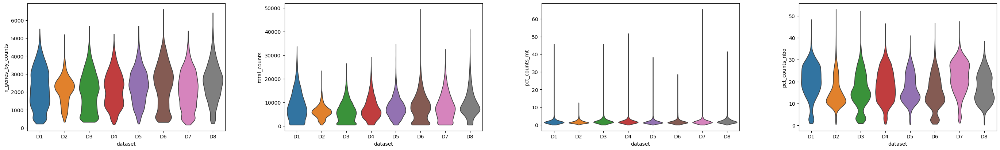

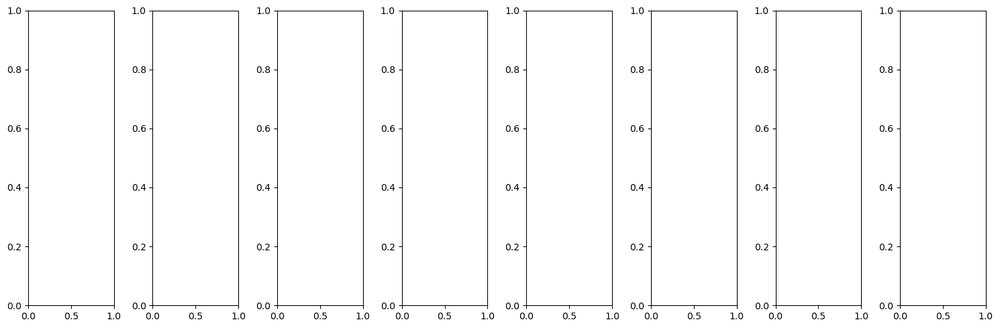

/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists wi

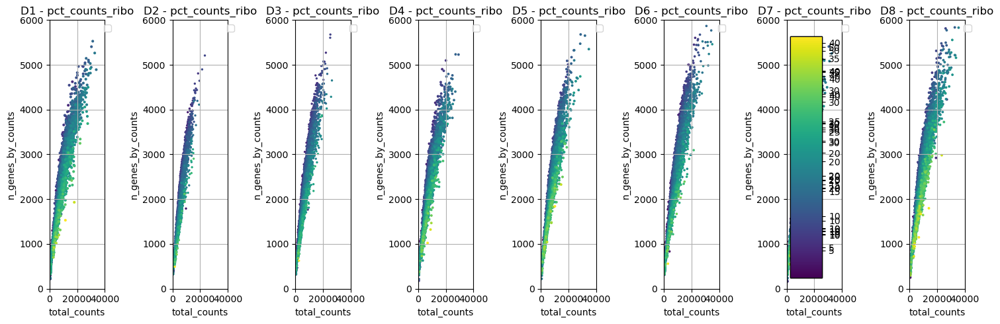

Applying QC filter for D1:
Initial AnnData has 3403 cells and 33989 genes
97 of 3403 cells contain more than 5% mitochondrial genes. Will be filtered
197 of 3403 cells contain less than 5% ribosomal genes. Will be filtered
237 of 3140 cells have fewer than 2000 counts. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


0 of 2903 cells have fewer than 300 genes. Will be filtered
19002 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 2903 cells and 14987 genes

Applying QC filter for D2:
Initial AnnData has 5041 cells and 33989 genes
54 of 5041 cells contain more than 5% mitochondrial genes. Will be filtered
85 of 5041 cells contain less than 5% ribosomal genes. Will be filtered
216 of 4914 cells have fewer than 2000 counts. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


0 of 4698 cells have fewer than 300 genes. Will be filtered
18475 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 4698 cells and 15514 genes

Applying QC filter for D3:
Initial AnnData has 5029 cells and 33989 genes
137 of 5029 cells contain more than 5% mitochondrial genes. Will be filtered
616 of 5029 cells contain less than 5% ribosomal genes. Will be filtered
249 of 4330 cells have fewer than 2000 counts. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


0 of 4081 cells have fewer than 300 genes. Will be filtered
18526 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 4081 cells and 15463 genes

Applying QC filter for D4:
Initial AnnData has 3892 cells and 33989 genes
105 of 3892 cells contain more than 5% mitochondrial genes. Will be filtered
131 of 3892 cells contain less than 5% ribosomal genes. Will be filtered
136 of 3694 cells have fewer than 2000 counts. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


0 of 3558 cells have fewer than 300 genes. Will be filtered
18937 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 3558 cells and 15052 genes

Applying QC filter for D5:
Initial AnnData has 3825 cells and 33989 genes
47 of 3825 cells contain more than 5% mitochondrial genes. Will be filtered
71 of 3825 cells contain less than 5% ribosomal genes. Will be filtered
117 of 3723 cells have fewer than 2000 counts. Will be filtered
0 of 3606 cells have fewer than 300 genes. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


18729 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 3606 cells and 15260 genes

Applying QC filter for D6:
Initial AnnData has 4408 cells and 33989 genes
95 of 4408 cells contain more than 5% mitochondrial genes. Will be filtered
498 of 4408 cells contain less than 5% ribosomal genes. Will be filtered
251 of 3854 cells have fewer than 2000 counts. Will be filtered
0 of 3603 cells have fewer than 300 genes. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


18201 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 3603 cells and 15788 genes

Applying QC filter for D7:
Initial AnnData has 3643 cells and 33989 genes
129 of 3643 cells contain more than 5% mitochondrial genes. Will be filtered
121 of 3643 cells contain less than 5% ribosomal genes. Will be filtered
317 of 3420 cells have fewer than 2000 counts. Will be filtered
0 of 3103 cells have fewer than 300 genes. Will be filtered
19054 of 33989 genes are expressed in fewer than 3 cells. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


Filtered AnnData has 3103 cells and 14935 genes

Applying QC filter for D8:
Initial AnnData has 3903 cells and 33989 genes
75 of 3903 cells contain more than 5% mitochondrial genes. Will be filtered
34 of 3903 cells contain less than 5% ribosomal genes. Will be filtered
211 of 3812 cells have fewer than 2000 counts. Will be filtered
0 of 3601 cells have fewer than 300 genes. Will be filtered


/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


18063 of 33989 genes are expressed in fewer than 3 cells. Will be filtered
Filtered AnnData has 3601 cells and 15926 genes

Visualizations QC Measures for multiple datasets:


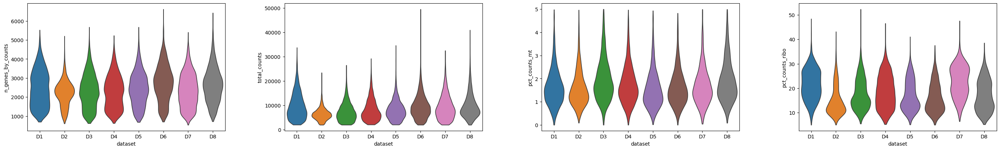

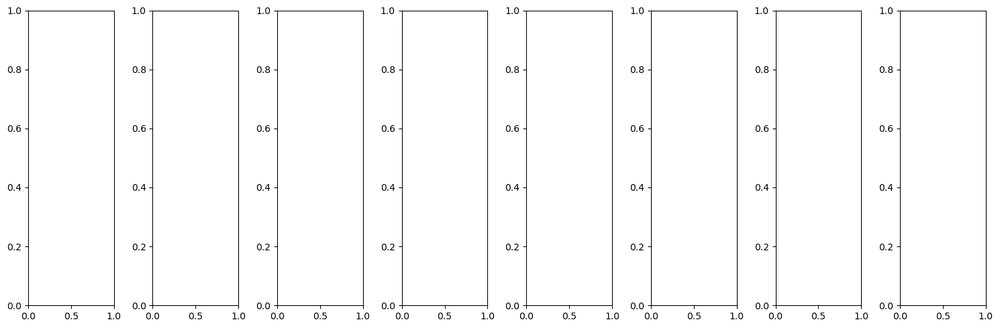

/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
/Users/loganlarlham/Documents/Summer_proj_2024/Notebooks/func_lib.py:195: UserWarning: No artists wi

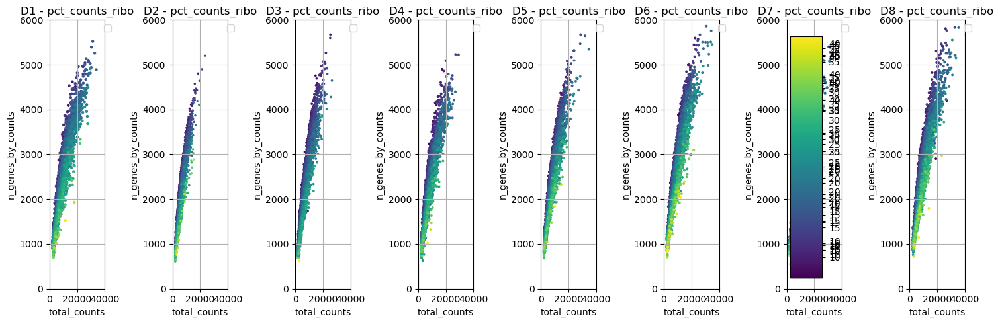

Processing non-microglia removal for D1:
Removing 67 cells annotated as 'Other' from D1
Cells after removal for D1: 2840

Processing non-microglia removal for D2:
Removing 509 cells annotated as 'Other' from D2
Cells after removal for D2: 4239

Processing non-microglia removal for D3:
Removing 387 cells annotated as 'Other' from D3
Cells after removal for D3: 3727

Processing non-microglia removal for D4:
Removing 124 cells annotated as 'Other' from D4
Cells after removal for D4: 3441

Processing non-microglia removal for D5:
Removing 209 cells annotated as 'Other' from D5
Cells after removal for D5: 3397

Processing non-microglia removal for D6:
Removing 207 cells annotated as 'Other' from D6
Cells after removal for D6: 3405

Processing non-microglia removal for D7:
Removing 31 cells annotated as 'Other' from D7
Cells after removal for D7: 3072

Processing non-microglia removal for D8:
Removing 0 cells annotated as 'Other' from D8
Cells after removal for D8: 3601

Total cells before r

/opt/homebrew/Caskroom/mambaforge/envs/Scanpy_env2_omni/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Datasets merged:
AnnData object with n_obs × n_vars = 27722 × 17341
    obs: 'K231', 'K233', 'K234', 'K219', 'Classification', 'most_likely_hypothesis', 'genotype', 'apoe', 'disease', 'treatment', 'genotype_treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', 'n_genes', 'G143', 'G146', 'K232', 'G180', 'K257', 'K261', 'K262', 'K268', 'G118', 'G119', 'G120', 'G122', 'G183', 'G184', 'G185', 'G186', 'K248', 'K249', 'K250', 'K252', 'G177', 'G178', 'G179', 'G145', 'K283', 'K284', 'sample'
Created subsets:
E3FAD  E4FAD  E3WT  E4WT  E3FAD_LPS  E3FAD_VEHICLE  E4FAD_LPS  E4FAD_VEHICLE  E3WT_LPS  E3WT_VEHICLE  E4WT_LPS  E4WT_VEHICLE  E3  E3_LPS  E3_VEHICLE  E4  E4_LPS  E4_VEHICLE  



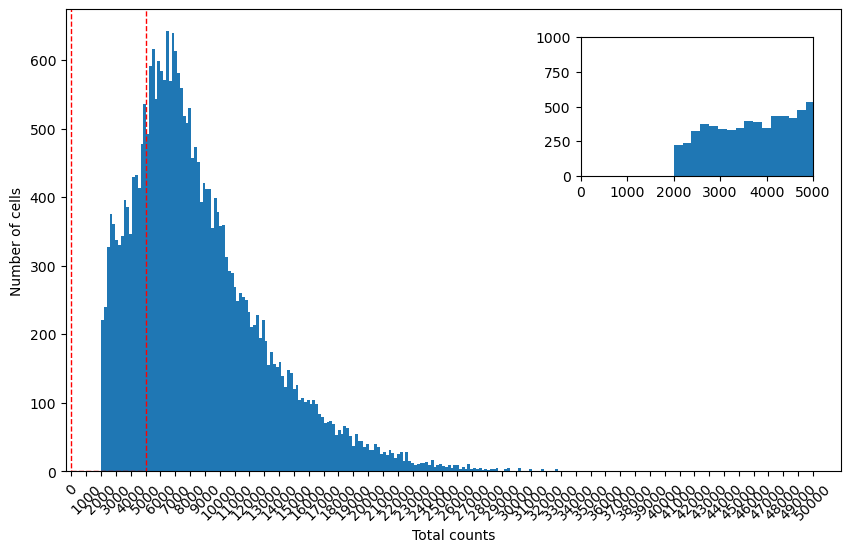

1124 out of 17341 genes are highly variable.
In E3FAD: 1676 out of 17341 genes are highly variable.
In E4FAD: 1875 out of 17341 genes are highly variable.
In E3WT: 1090 out of 17341 genes are highly variable.
In E4WT: 1310 out of 17341 genes are highly variable.
In E3FAD_LPS: 1930 out of 17341 genes are highly variable.
In E3FAD_VEHICLE: 2052 out of 17341 genes are highly variable.
In E4FAD_LPS: 2239 out of 17341 genes are highly variable.
In E4FAD_VEHICLE: 2204 out of 17341 genes are highly variable.
In E3WT_LPS: 1405 out of 17341 genes are highly variable.
In E3WT_VEHICLE: 1186 out of 17341 genes are highly variable.
In E4WT_LPS: 1409 out of 17341 genes are highly variable.
In E4WT_VEHICLE: 1619 out of 17341 genes are highly variable.
In E3: 1065 out of 17341 genes are highly variable.
In E3_LPS: 1211 out of 17341 genes are highly variable.
In E3_VEHICLE: 1145 out of 17341 genes are highly variable.
In E4: 1410 out of 17341 genes are highly variable.
In E4_LPS: 1675 out of 17341 gene

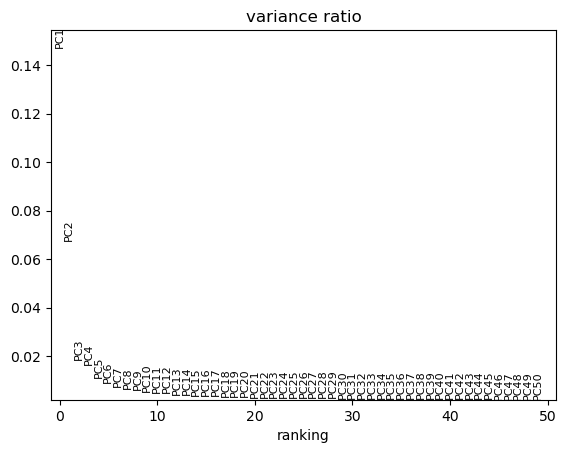

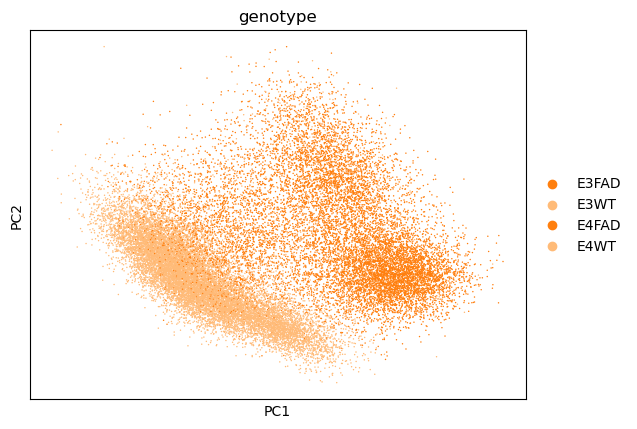

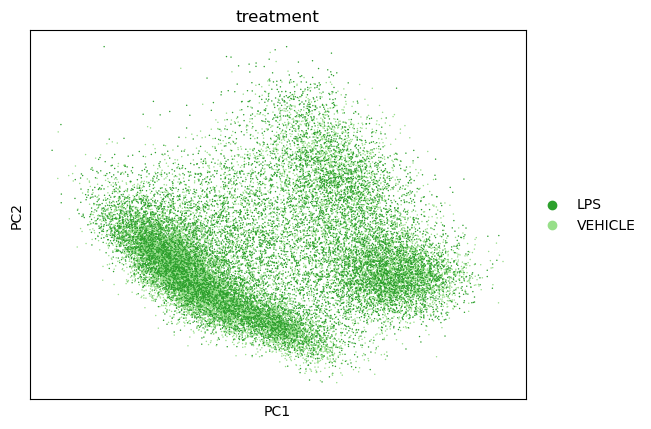

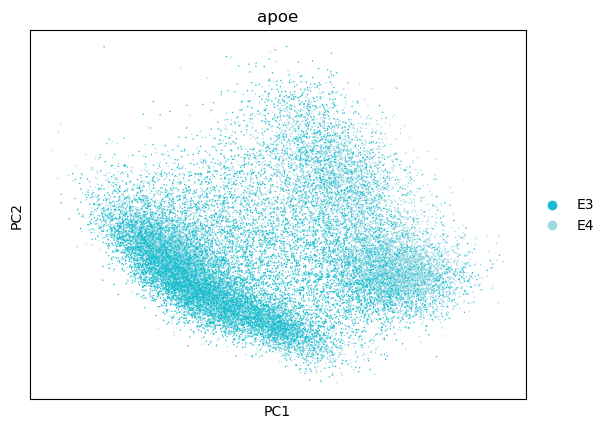

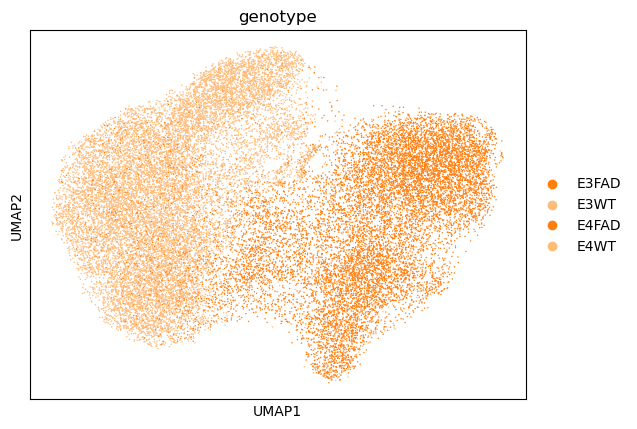

...

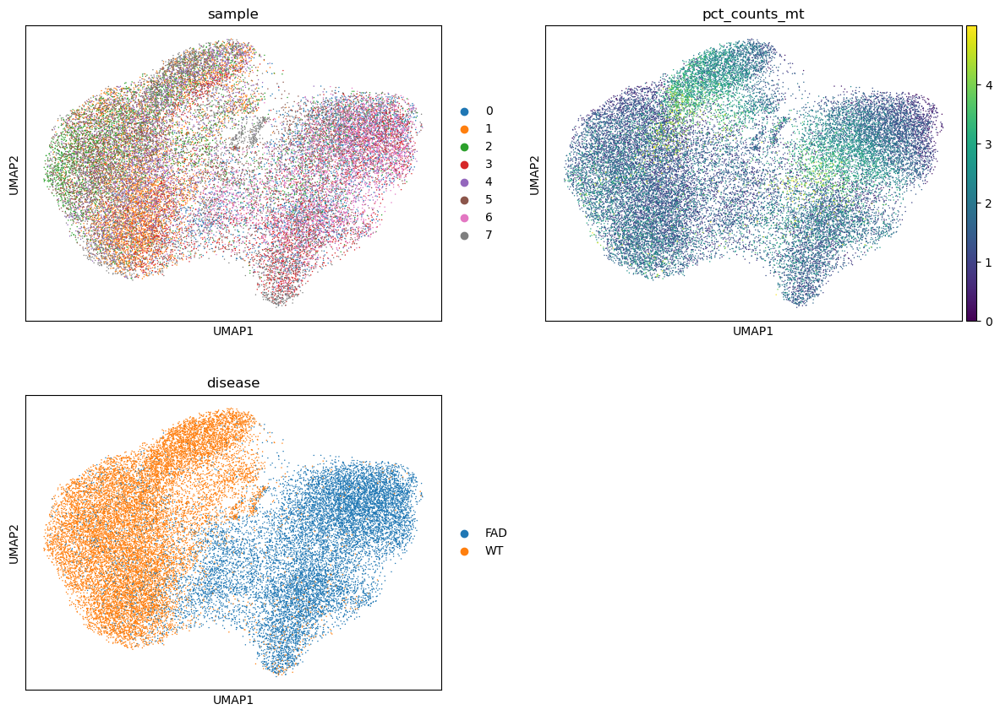

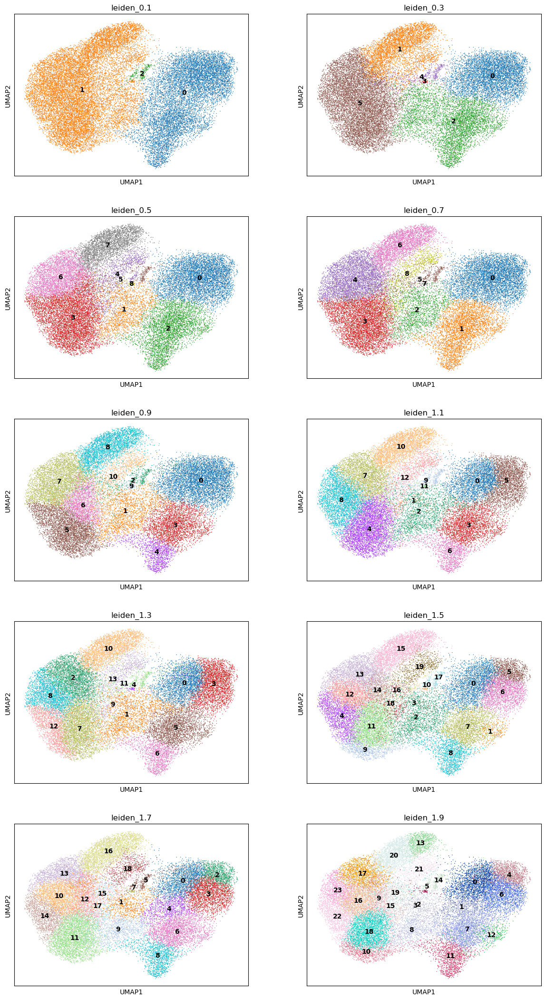

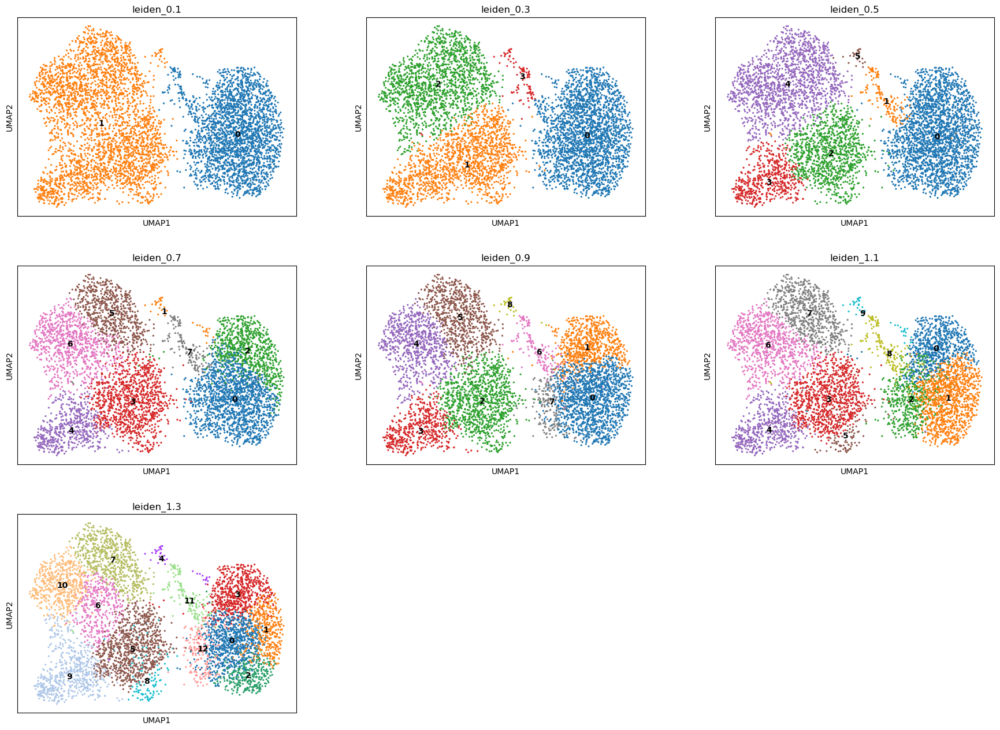

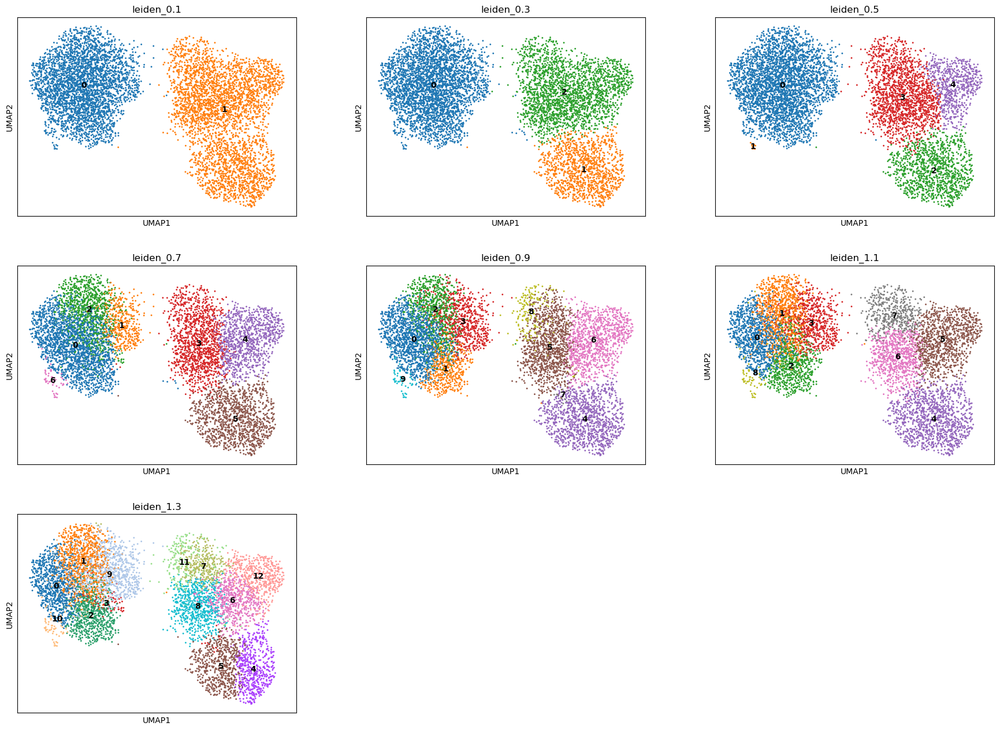

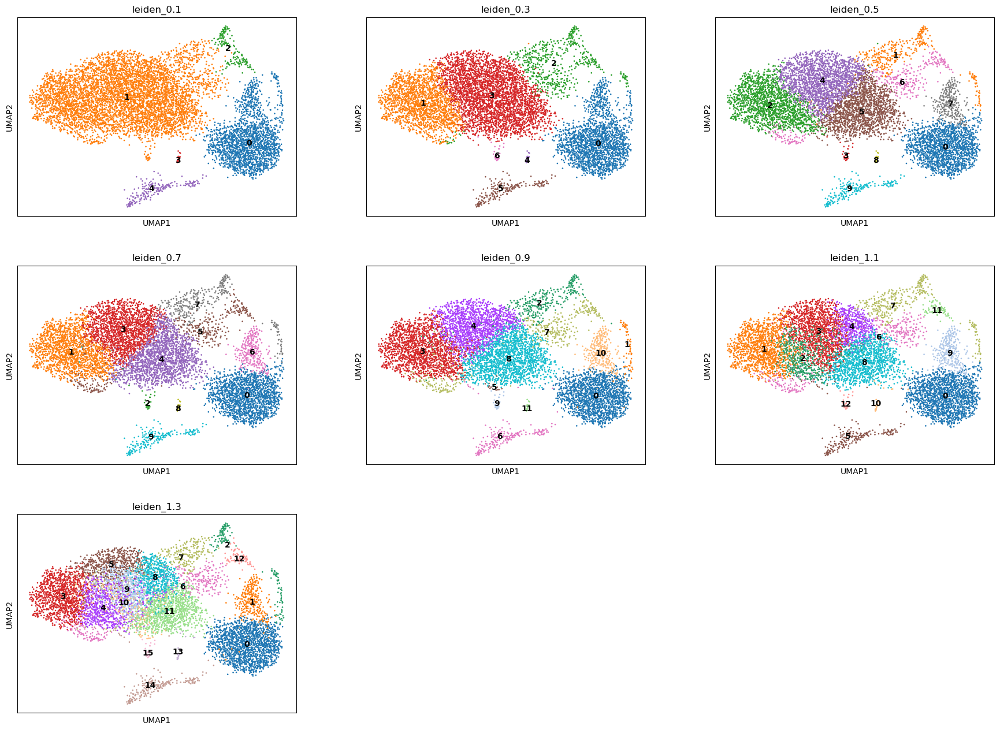

In [ ]:
def main():
    # Data Loading
    adatas = load_data(DATA_PATHS)
    manual_annotations = load_manual_annotations(MANUAL_ANNOTATIONS_PATH)
    
    # Process D8 Hashtags
    if "D8" in adatas:
        print_hashtag_info(adatas["D8"])
        adatas["D8"] = rename_hashtags_d8(adatas["D8"])
    
    adatas = demultiplex_hashtags(adatas)
    adatas = filter_cells_and_annotate(adatas)
    group_and_print_sizes(adatas)
    adatas = remove_hashtag_genes(adatas)
    qc_filtered = quality_control(adatas)
    qc_filtered = remove_non_microglia(qc_filtered, manual_annotations)
    
    # Merge Datasets
    adata = merge_datasets(qc_filtered)
    
    # Set consistent palettes for key metadata fields
    set_consistent_palettes(adata)
    
    # Create Experimental Subsets
    subsets = create_subsets(adata)
    
    # Normalization and HVG Detection
    adata = normalize_and_hvg(adata, subsets)
    
    # Cell Cycle Analysis
    adata = cell_cycle_analysis(adata)
    
    # Regress Mitochondrial Genes
    adata, subsets = regress_mitochondrial(adata, subsets)
    
    # Dimensionality Reduction (PCA, UMAP)
    adata, subsets = dimensionality_reduction(adata, subsets)
    
    # Clustering (Leiden)
    adata, subsets = clustering(adata, subsets)
    
    # Plot DEGs by Cluster
    plot_degs_by_cluster(adata)
    
    # Assign Cell Types
    adata = assign_cell_types(adata)
    
    # Visualize Cell Types (UMAPs, density plots, bar charts)
    plot_cell_type_visualizations(adata)
    
    # Run Wilcoxon DEGs on Subsets
    run_wilcoxon_degs(subsets)
    
    # Specific Gene Analysis
    specific_gene_analysis(adata)
    
    # Pseudobulk Analysis with Decoupler
    pseudobulk_decoupler_analysis(subsets)
    
    # Gene Ontology Analysis
    gene_ontology_analysis()
    
    # Save Minimal AnnData for Publication
    save_minimal_anndata(adata)
    
    gc.collect()

if __name__ == '__main__':
    main()